# Import

In [1]:
import os
import sys
sys.path.append(os.path.abspath('..'))

import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib
import numpy as np

from grace.visuomotor import PeopleAttention

# Initialization 

In [30]:
left_image_list = []
folder_path = os.path.join(os.getcwd(),'results', '2023112_005548_969511_Qual','left')
for i, filename in enumerate(sorted(os.listdir(folder_path))):
    img_path = os.path.join(folder_path, filename)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (640, 480))
    left_image_list.append(image)

In [31]:
right_image_list = []
folder_path = os.path.join(os.getcwd(),'results', '2023112_005548_969511_Qual','right')
for i, filename in enumerate(sorted(os.listdir(folder_path))):
    img_path = os.path.join(folder_path, filename)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (640, 480))
    right_image_list.append(image)

# Chessboard Detection

In [32]:
def get_camera_mtx(filename='config/camera/camera_mtx.json'):
    with open(filename, 'r') as stream:
        data = json.load(stream)
        l_mtx = np.array(data['left_eye']['camera_matrix'])
        l_dist = np.array(data['left_eye']['distortion_coefficients'])
        r_mtx = np.array(data['right_eye']['camera_matrix'])
        r_dist = np.array(data['right_eye']['distortion_coefficients'])
        return l_mtx, l_dist, r_mtx, r_dist    


def draw_axis(img, corners, imgpts):
    corner = tuple(corners[0].astype(int).ravel())
    img = cv2.line(img, corner, tuple(imgpts[0].astype(int).ravel()), (255,0,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[1].astype(int).ravel()), (0,255,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[2].astype(int).ravel()), (0,0,255), 5)
    return img

def process_img(img, mtx, dist, camera):
    px = (None,None)
    chess_idx = 21

    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    objp = np.zeros((6*9,3), np.float32)
    SQUARE_LENGTH = 47
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) * SQUARE_LENGTH
    axis = np.float32([[2,0,0], [0,2,0], [0,0,-2]]).reshape(-1,3) * SQUARE_LENGTH  # Vector direction for display

    if ret == True:
        corners2 = cv2.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        s_corners = corners2.squeeze()

        # Find the rotation and translation vectors.
        ret, rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)
        rmat,_ = cv2.Rodrigues(rvecs)
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw_axis(img,corners2,imgpts)
        px = s_corners[chess_idx]
        print(s_corners)

    return img, px

In [33]:
# LEFT
# Getting Target Pixels
left_pixel_list = []
left_disp_img_list = []
l_mtx, l_dist, r_mtx, r_dist  = get_camera_mtx()
for i in range(len(left_image_list)):
    img = left_image_list[i]a
    img,px = process_img(img, l_mtx, l_dist, camera='left')
    
    left_pixel_list.append(px)
    left_disp_img_list.append(img)

[[198.1521  238.68715]
 [214.40881 238.7269 ]
 [230.70976 238.86607]
 [246.65349 238.90399]
 [262.72897 239.0437 ]
 [278.5136  239.04912]
 [294.41733 239.15259]
 [310.00806 239.16528]
 [325.82257 239.29881]
 [198.21278 254.5594 ]
 [214.41002 254.61592]
 [230.56013 254.62105]
 [246.64531 254.6786 ]
 [262.59097 254.67926]
 [278.43094 254.73746]
 [294.16592 254.81995]
 [309.9969  254.82098]
 [325.51    254.73282]
 [198.16447 270.49234]
 [214.35388 270.47467]
 [230.50015 270.5076 ]
 [246.52766 270.4475 ]
 [262.48163 270.43875]
 [278.28094 270.4316 ]
 [294.12326 270.43527]
 [309.7064  270.42505]
 [325.3348  270.3592 ]
 [198.1128  286.33737]
 [214.32912 286.3379 ]
 [230.38974 286.27148]
 [246.43417 286.32236]
 [262.33304 286.18344]
 [278.2083  286.1678 ]
 [293.8611  286.05844]
 [309.55142 285.97577]
 [325.1149  285.9257 ]
 [198.11475 302.25266]
 [214.24205 302.05472]
 [230.35449 302.04865]
 [246.29936 301.91684]
 [262.18906 301.95435]
 [278.01788 301.70978]
 [293.7302  301.57874]
 [309.32687

In [36]:
# RIGHT
# Getting Target Pixels
right_pixel_list = []
right_disp_img_list = []
l_mtx, l_dist, r_mtx, r_dist  = get_camera_mtx()
for i in range(len(right_image_list)):
    img = right_image_list[i]
    img,px = process_img(img, r_mtx, r_dist, camera='right')
    
    right_pixel_list.append(px)
    right_disp_img_list.append(img)

[[ 95.05056  251.32402 ]
 [113.30341  251.74571 ]
 [131.5084   252.21255 ]
 [149.36539  252.58972 ]
 [167.00142  252.99866 ]
 [184.2313   253.42024 ]
 [201.342    253.75401 ]
 [217.97218  254.22952 ]
 [234.53055  254.61299 ]
 [ 94.43028  268.4048  ]
 [112.688255 268.7384  ]
 [130.75513  269.08905 ]
 [148.71748  269.33298 ]
 [166.30487  269.59375 ]
 [183.60472  269.874   ]
 [200.56018  270.26044 ]
 [217.34406  270.43427 ]
 [233.76357  270.75253 ]
 [ 93.86421  285.52502 ]
 [112.00707  285.7359  ]
 [130.1589   286.02658 ]
 [147.94691  286.13443 ]
 [165.53975  286.27344 ]
 [182.79828  286.42377 ]
 [199.84787  286.5321  ]
 [216.58466  286.70834 ]
 [233.06534  286.83224 ]
 [ 93.195114 302.58017 ]
 [111.396484 302.6858  ]
 [129.38683  302.88004 ]
 [147.24231  302.97916 ]
 [164.74768  302.95947 ]
 [182.13899  302.9885  ]
 [199.09111  303.04166 ]
 [215.82597  303.00323 ]
 [232.34793  303.12384 ]
 [ 92.61234  319.63907 ]
 [110.68713  319.65738 ]
 [128.69054  319.6824  ]
 [146.43054  319.68732 ]


[[283.5035  327.21527]
 [299.43573 327.3785 ]
 [315.68243 327.48502]
 [331.86212 327.7033 ]
 [348.40854 327.93942]
 [364.70892 328.15198]
 [381.47482 328.41672]
 [398.18744 328.6741 ]
 [415.2264  329.04825]
 [283.40582 343.7438 ]
 [299.5035  343.9991 ]
 [315.6234  344.20905]
 [332.06805 344.4486 ]
 [348.4747  344.6722 ]
 [365.06677 345.03076]
 [381.67505 345.37015]
 [398.6527  345.6541 ]
 [415.6312  346.0798 ]
 [283.38083 360.51947]
 [299.44235 360.7881 ]
 [315.74152 361.1257 ]
 [332.17126 361.40503]
 [348.67606 361.7014 ]
 [365.26532 362.10617]
 [382.13583 362.4849 ]
 [398.94574 362.8868 ]
 [416.12183 363.3144 ]
 [283.2824  377.40875]
 [299.49893 377.7449 ]
 [315.70206 378.16278]
 [332.253   378.57806]
 [348.78738 378.97595]
 [365.57297 379.37802]
 [382.39667 379.76587]
 [399.45294 380.2838 ]
 [416.5554  380.71402]
 [283.27914 394.48764]
 [299.44183 394.84967]
 [315.84387 395.32477]
 [332.3767  395.78708]
 [348.9942  396.40723]
 [365.8185  396.74228]
 [382.71844 397.21945]
 [399.7882 

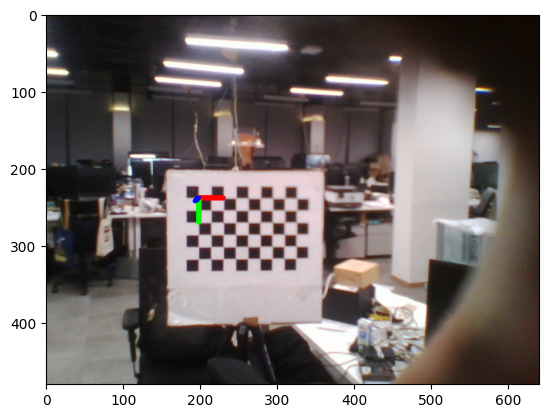

[246.52766 270.4475 ]


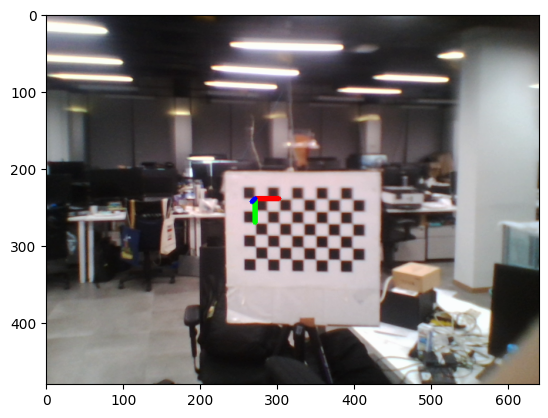

[318.60577 271.2139 ]


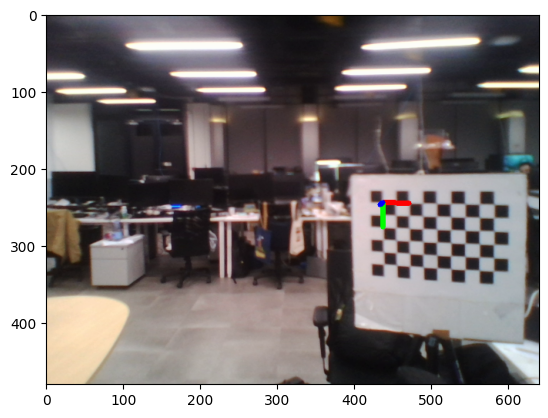

[489.18317 278.65414]


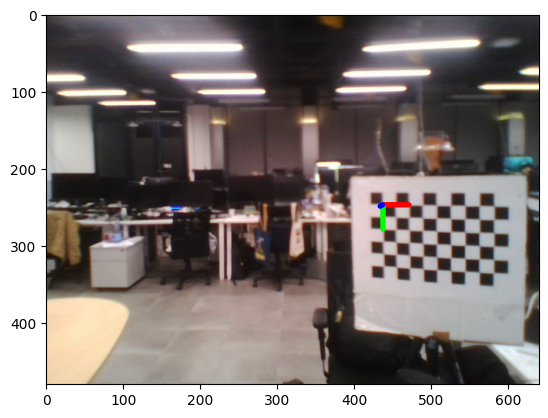

[489.2006  281.06653]


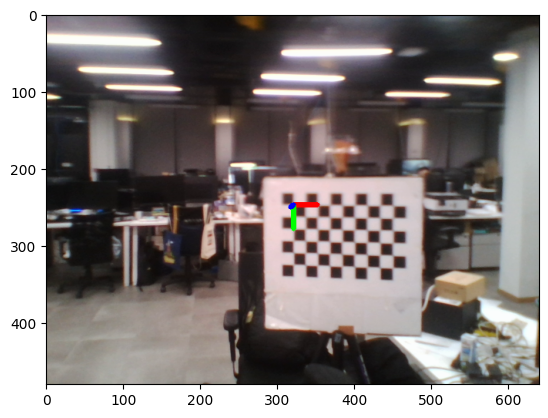

[368.29187 279.42368]


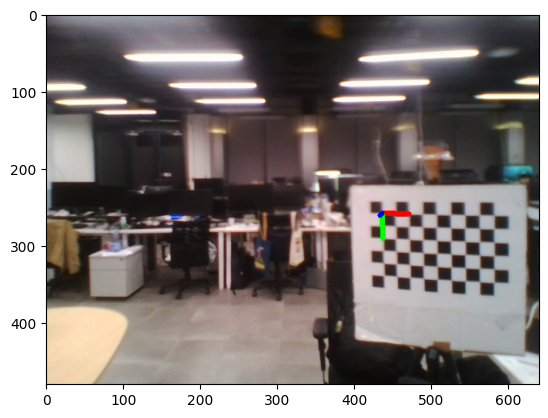

[489.27863 293.03546]


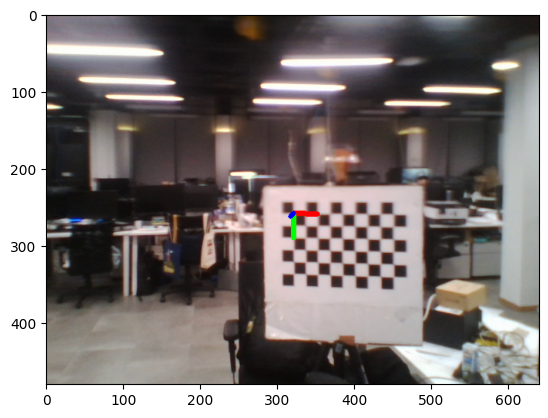

[368.59515 290.81247]


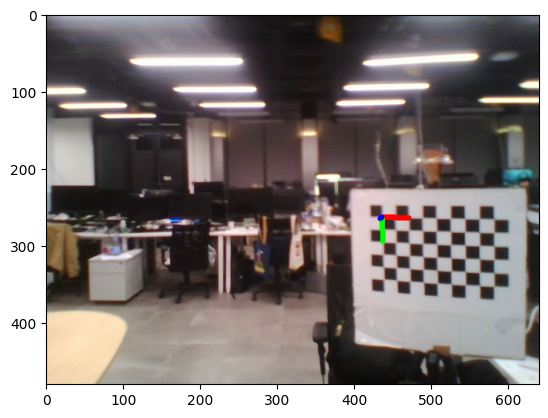

[489.27576 297.9078 ]


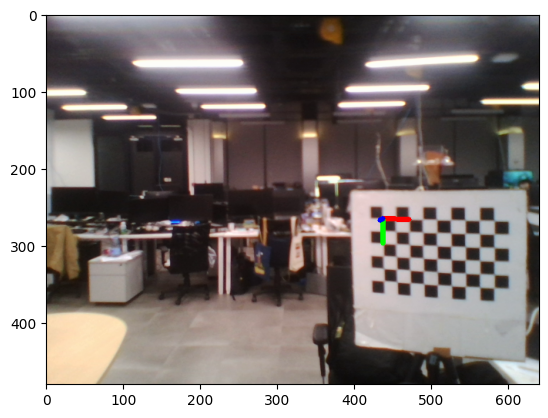

[489.443   299.91107]


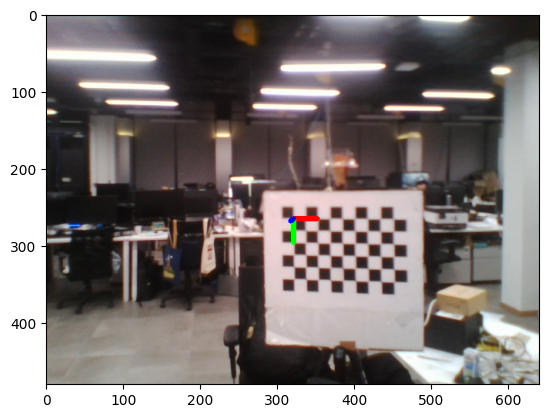

[368.92792 297.12976]


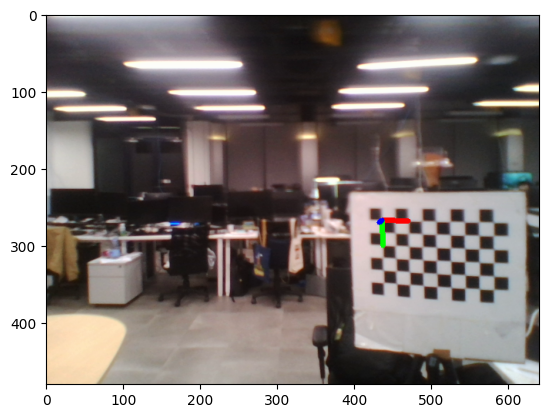

[488.725 302.088]


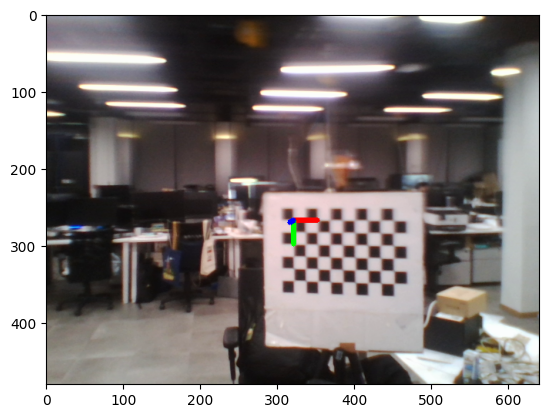

[368.57977 299.2401 ]


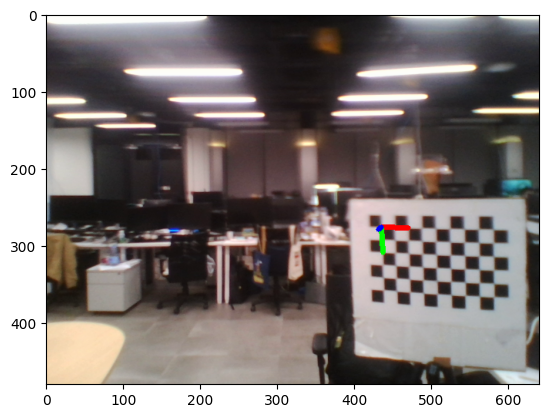

[488.55734 311.36618]


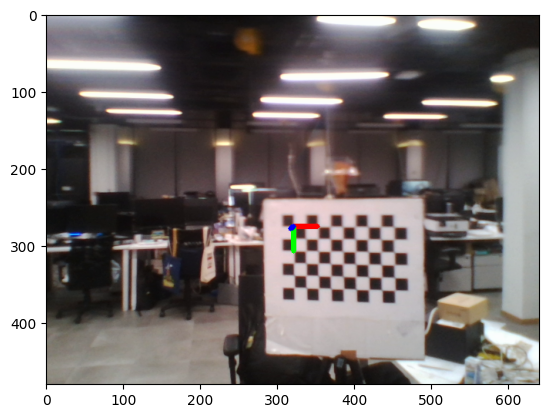

[369.2208  307.77954]


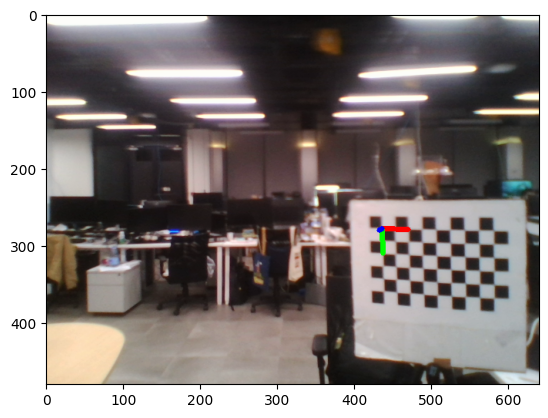

[488.86826 312.87518]


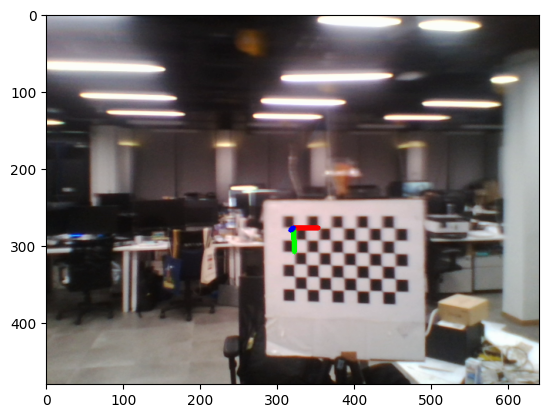

[369.7158  309.34628]


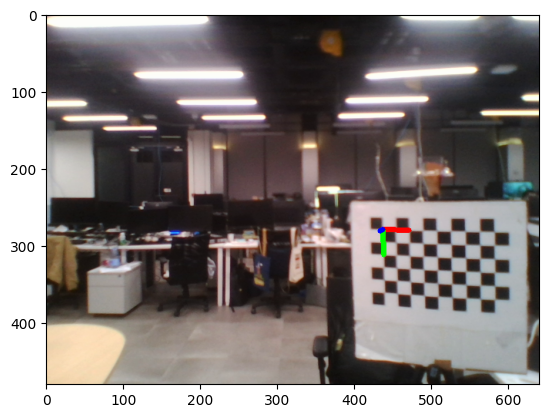

[489.78366 314.4983 ]


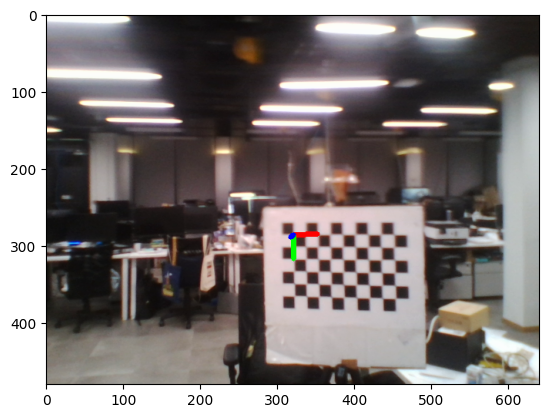

[369.40012 318.1343 ]


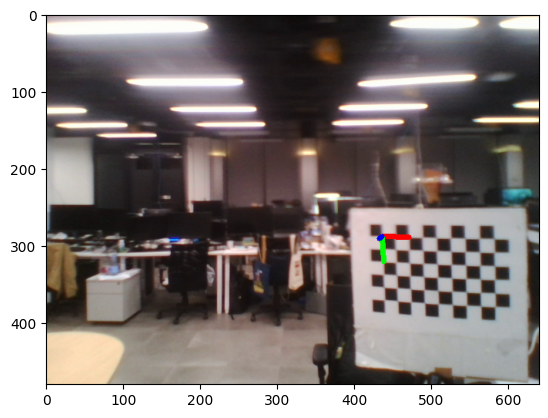

[489.7435  323.72693]


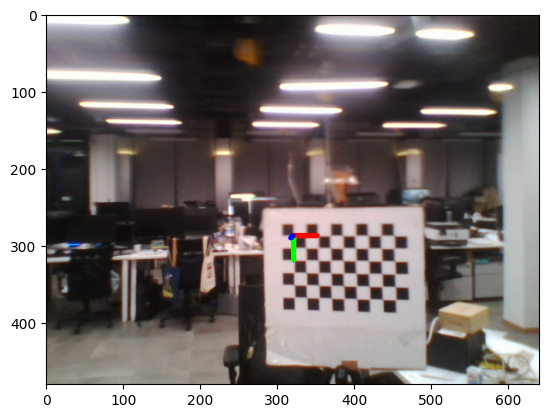

[369.58014 319.69986]


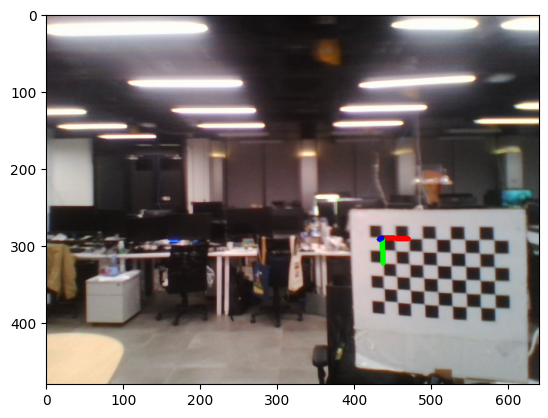

[489.5268  325.32144]


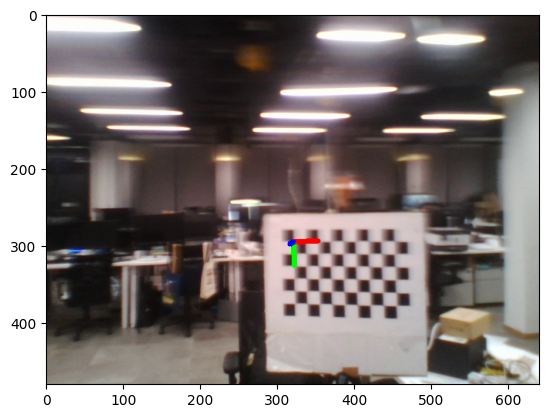

[369.8975  327.09125]


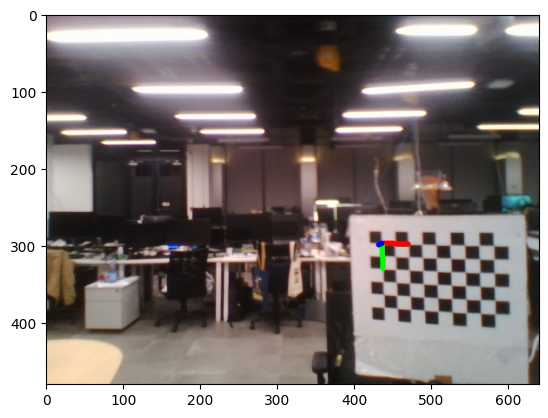

[489.4206  333.07605]


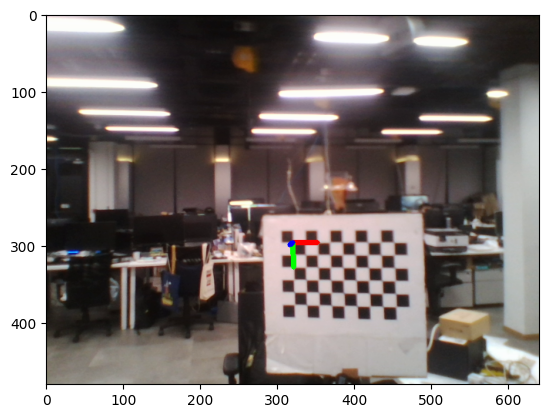

[369.31808 328.629  ]


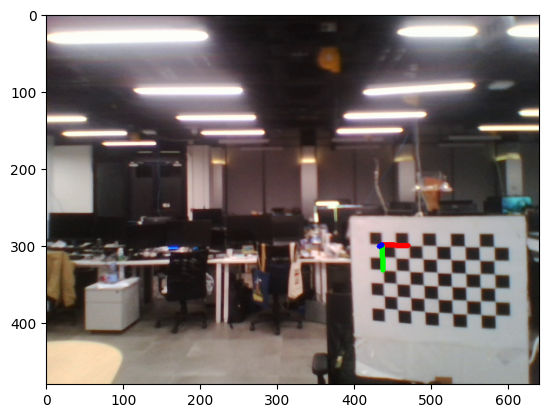

[489.74063 334.55368]


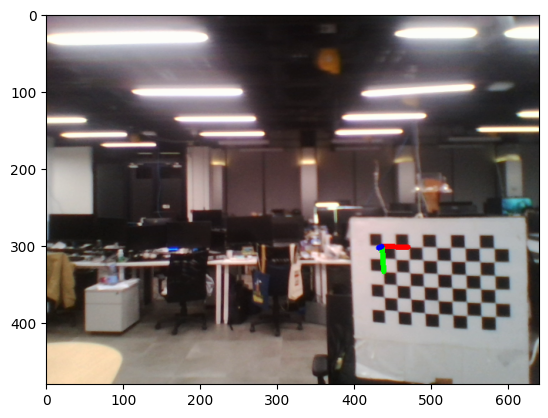

[489.9302 336.3493]


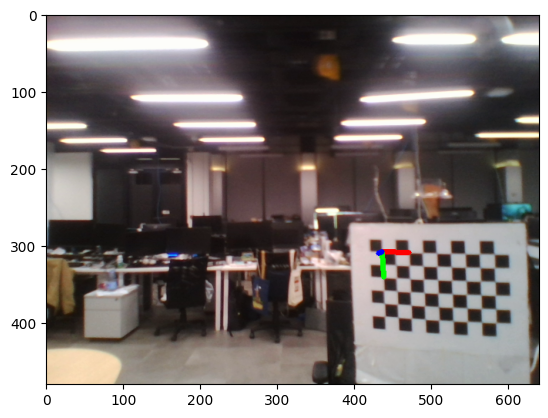

[490.27026 344.20966]


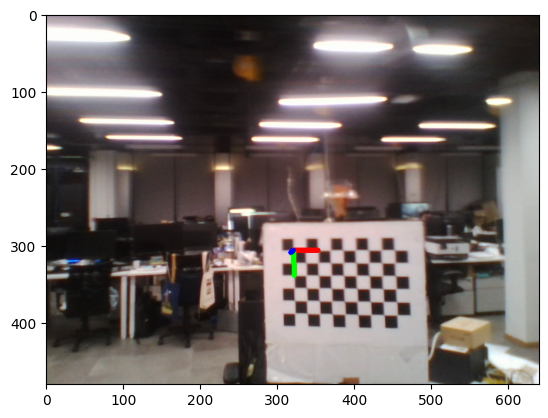

[370.0518  339.18933]


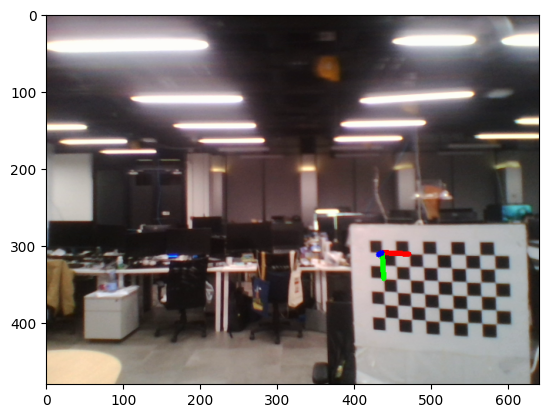

[490.52054 345.57782]


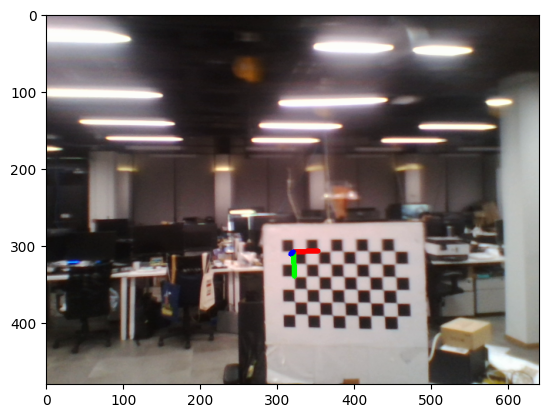

[370.18918 340.5494 ]


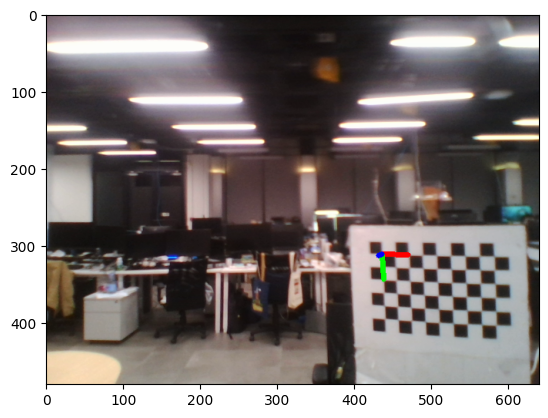

[490.27884 347.211  ]


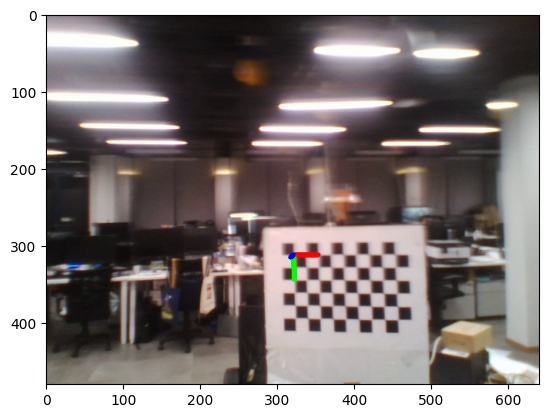

[370.76825 345.03635]


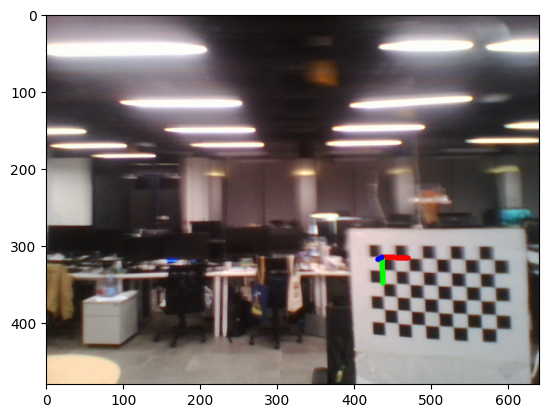

[489.9777 351.4561]


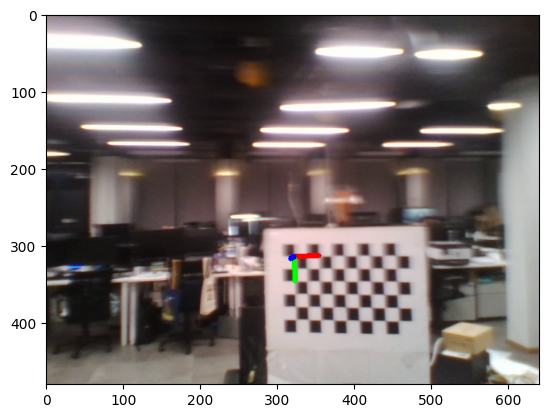

[371.38147 346.5148 ]


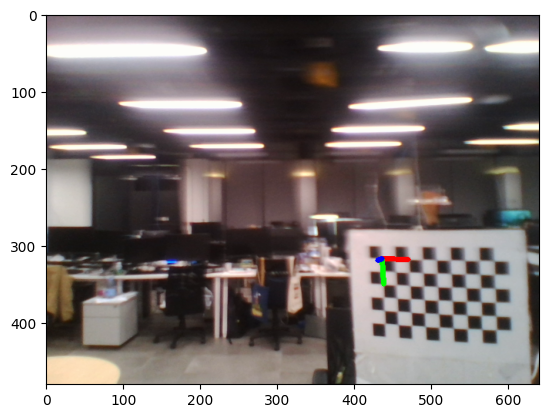

[490.04535 353.0949 ]


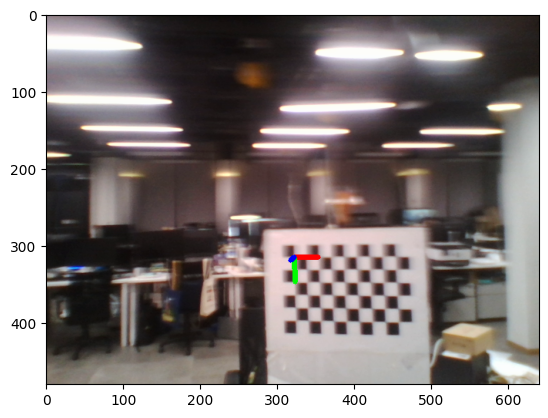

[371.34348 347.76605]


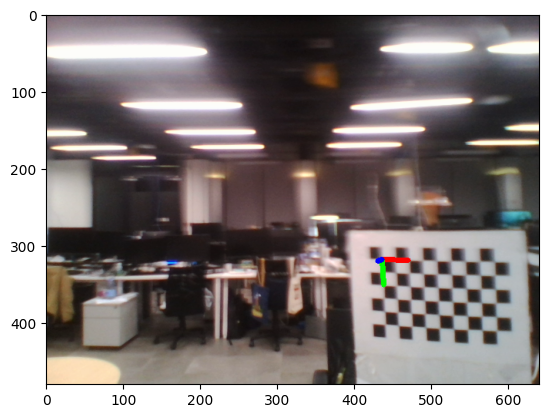

[490.48135 354.177  ]


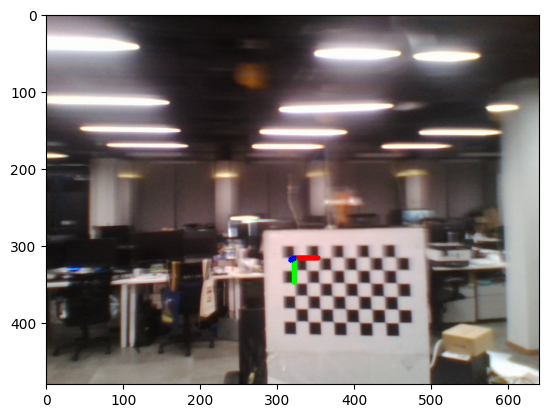

[371.06738 348.83777]


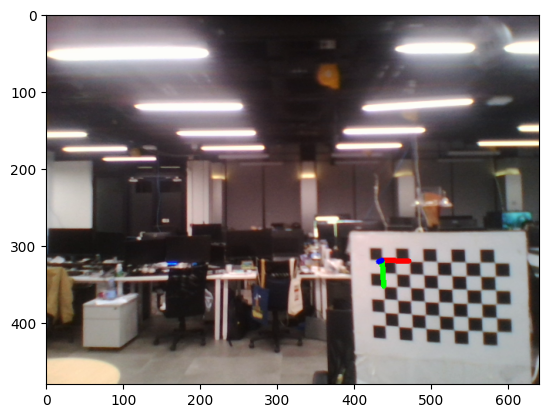

[490.89438 355.52472]


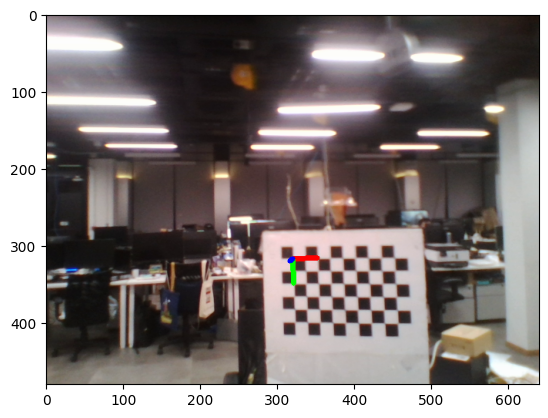

[370.08066 349.70578]


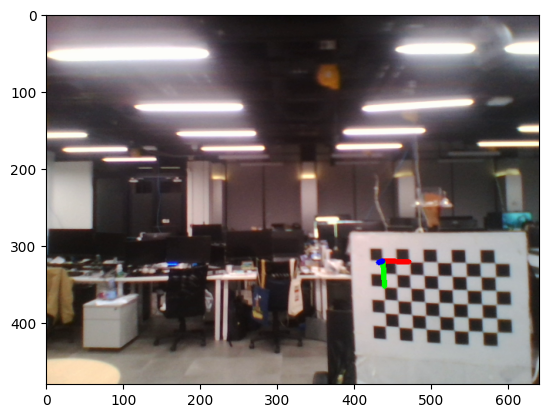

[491.24673 356.1969 ]


In [34]:
# Check Images
for i in range(len(left_disp_img_list)):
    img = left_disp_img_list[i]
    plt.imshow(img)
    plt.show()
    print(left_pixel_list[i])

# Analysis

25.656633


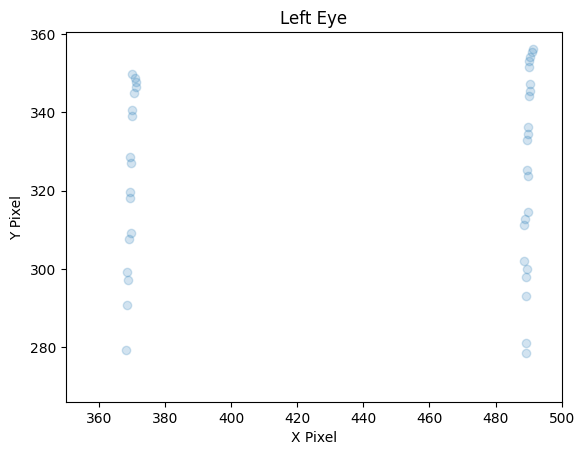

In [77]:
l_x = [x[0] for x in left_pixel_list]
l_y = [x[1] for x in left_pixel_list]
plt.scatter(l_x, l_y, alpha=0.2)
plt.xlim([350, 500])
plt.title('Left Eye')
plt.xlabel('X Pixel')
plt.ylabel('Y Pixel')
print(np.std(l_y))

(350.0, 500.0)

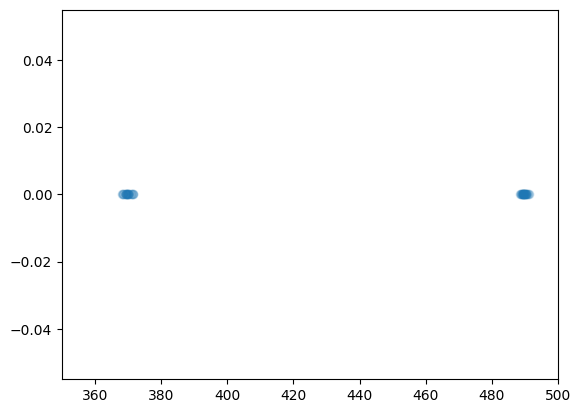

In [50]:
l_x = [x[0] for x in left_pixel_list]
plt.scatter(l_x, [0]*len(l_x), alpha=0.2)
plt.xlim([350, 500])

In [52]:
l_x_1 = []
l_x_2 = []
for x in l_x:
    if x > 440:
        l_x_1.append(x)
    elif x > 360 and x < 440:
        l_x_2.append(x)
print(np.std(l_x_1))
print(np.std(l_x_2))

0.6733365
0.92312676


24.026436


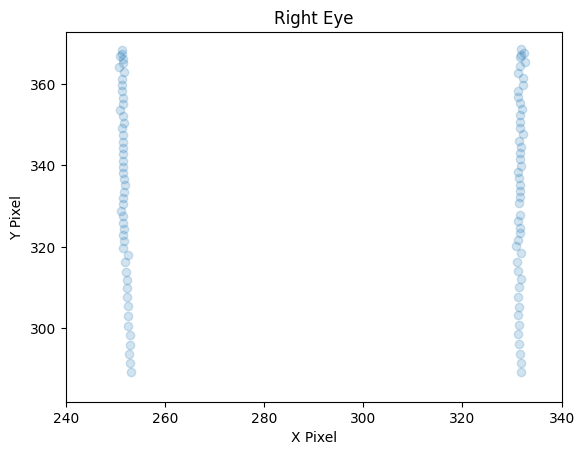

In [75]:
r_x = [x[0] for x in right_pixel_list]
r_y = [x[1] for x in right_pixel_list]
plt.scatter(r_x, r_y, alpha=0.2)
plt.xlim([240, 340])
plt.title('Right Eye')
plt.xlabel('X Pixel')
plt.ylabel('Y Pixel')
print(np.std(r_y))

(240.0, 340.0)

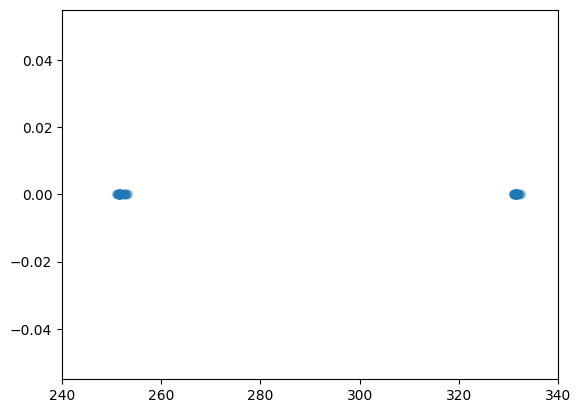

In [49]:
r_x = [x[0] for x in right_pixel_list]
plt.scatter(r_x, [0]*len(r_x), alpha=0.2)
plt.xlim([240, 340])

In [60]:
r_x_1 = []
r_x_2 = []
for x in r_x:
    if x > 320:
        r_x_1.append(x)
    elif x > 240 and x < 320:
        r_x_2.append(x)
print(np.std(r_x_1))
print(np.std(r_x_2))

0.33857787
0.56619745


ValueError: x and y must be the same size

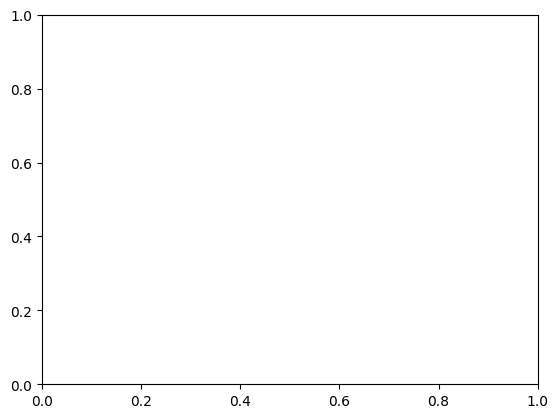

In [68]:
plt.scatter(l_x_1, l_y, alpha=0.2, color='blue')
plt.scatter(l_x_2, l_y, alpha=0.2, color='blue')
plt.scatter(r_x_1, r_y, alpha=0.2, color='orange')
plt.scatter(r_x_2, r_y, alpha=0.2, color='orange')
plt.xlabel('x pixel')
plt.xlabel('y pixel')

In [ ]:
l_x_1 = []
l_x_2 = []
for x in l_x:
    if x > 440:
        l_x_1.append(x)
    elif x > 360 and x < 440:
        l_x_2.append(x)
print(np.std(l_x_1))
print(np.std(l_x_2))

In [ ]:
target_list = [-26, -13, 0, 13, 26]
color_list = ['red', 'blue', 'green']
marker_list = ['*', 'o']
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(6, 8), sharex='col', sharey='row')

for i in range(len(target_list)):
    x = pixel_list[i][0]
    y = pixel_list[i][1]
    axs[i].scatter(x,y)
    axs[i].set_xlim([0, 639])
    axs[i].set_ylim([479,0])
    axs[i].set_ylabel('y (px)')
    axs[i].set_title(str(target_list[i]) + " (deg)" )

axs[-1].set_xlabel('x (px)')
fig.subplots_adjust(hspace=0.4, wspace=1)
plt.show()